<a href="https://colab.research.google.com/github/FF132FF/methods-and-algorithms-of-digital-image-processing/blob/main/Practical_work_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install imageai # установка библиотеки ImageAI

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.8/69.8 kB 1.9 MB/s eta 0:00:00


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Добавляем в проект исходное изображение:

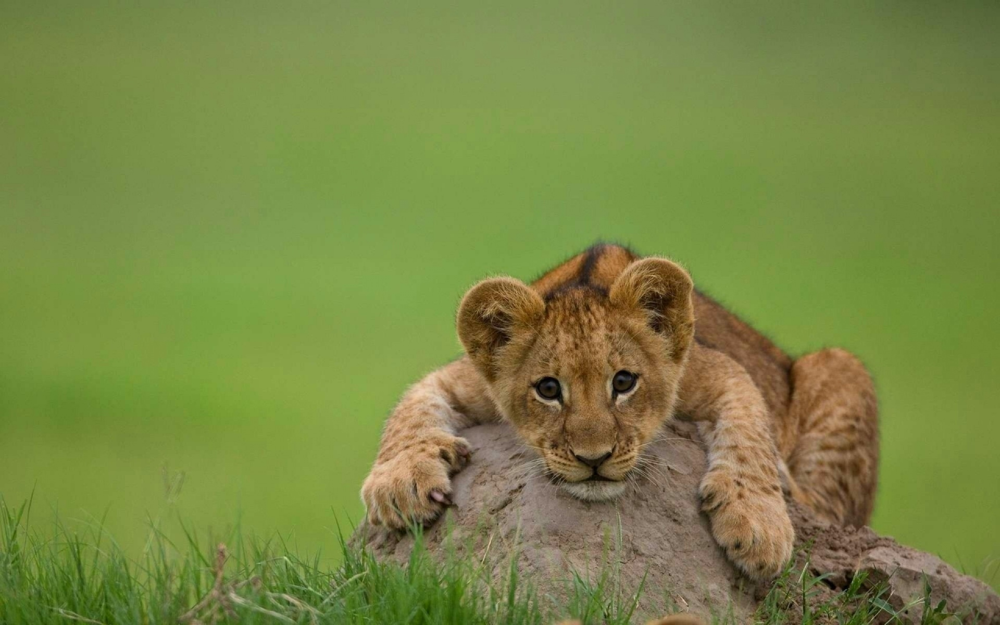

In [9]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from urllib.request import urlopen
req = urlopen('https://img.youscreen.ru/wall/14977257054998/14977257054998_1920x1200.jpg') # используя метод urlopen, получаем объект запроса по ссылке (изображение)
                                                                                      # и сохраняем его в виде потокового набора данных в переменную "req"

image_2 = np.asarray(bytearray(req.read()), dtype=np.uint8) # преобразуем потоковый набор данных в массив numpy
image_2 = cv2.imdecode(image_2, -1) # декодируем изображение в привычный для отображения формат

cv2_imshow(image_2) # Выводим изображение, используя метод cv2_imshow()

# Пример №1. Детекция

[Техническая документация](https://imageai.readthedocs.io/en/latest/detection/index.html)

[{'name': 'cat', 'percentage_probability': 87.99, 'box_points': [694, 479, 1705, 1116]}]


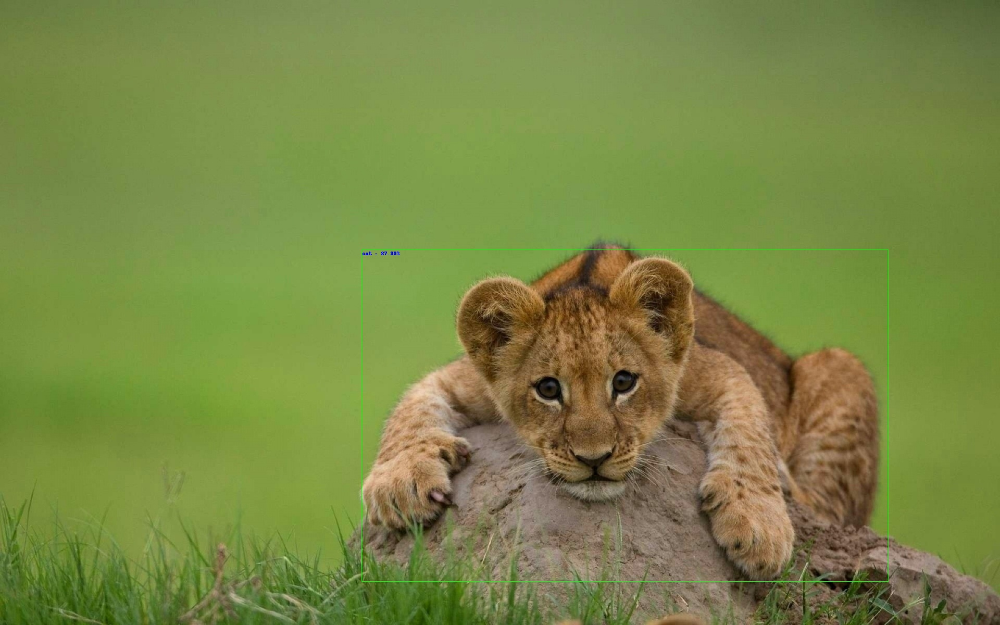

In [12]:
from imageai.Detection import ObjectDetection # Импортируем из библиотеки imageai класс ObjectDetection для поиска объектов
import os # Импортируем библиотеку os для взаимодействия с ОС

exec_path = os.getcwd()# Объявляем переменную exec_path и помещаем в неё функцию os.getcwd()для указания пути к данному проекту (для удобства работы с файлами, находящимися в корневой папке проекта)

detector = ObjectDetection() # создаем объект класса ObjectDetection
detector.setModelTypeAsRetinaNet() # обращаемся к методу setModelTypeAsRetinaNet, тем самым устанавливая для использования в проекте модель RetinaNet для распознавания объектов
detector.setModelPath(r"/content/drive/MyDrive/Предварительно обученные модели/retinanet.pth") # указываем путь к модели (предварительно модель необходимо скачать с официального сайта ImageAI и поместить в корневую папку проекта)
detector.loadModel() # загружаем модель

list = detector.detectObjectsFromImage( # используем метод detectObjectsFromImage для обнаружения объектов на изображении
    input_image=image_2, # указываем путь к исходному изображению, либо имя переменной, которая уже содержит изображение
    output_image_path=os.path.join(exec_path, "new_objects.jpg"), # указываем имя и путь для сохранения распознанного изображения
    minimum_percentage_probability=60, # дополнительная характеристика, отвечающая за процент точности распознавания объекта. В данном случае, если точность объекта будет меньше, чем 60%, то в конечной выборке он присутствовать не будет
    display_percentage_probability=True, # отображение процента точности в конечном изображении
    display_object_name=True # отображение класса объекта в конечном изображении
)

print(list)
output_image = cv2.imread("new_objects.jpg")
cv2_imshow(output_image)

# Пример №2. Классификация

[Техническая документация](https://imageai.readthedocs.io/en/latest/prediction/index.html)

In [6]:
from imageai.Classification import ImageClassification
import os

/usr/local/lib/python3.10/dist-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


In [13]:
execution_path = "/content/drive/MyDrive/Предварительно обученные модели/resnet50.pth"

prediction = ImageClassification()
prediction.setModelTypeAsResNet50()
prediction.setModelPath(execution_path)
prediction.loadModel()

In [14]:
predictions, probabilities = prediction.classifyImage((image_2), result_count=10)
for eachPrediction, eachProbability in zip(predictions, probabilities):
    print(eachPrediction , " : " , eachProbability)

snow leopard  :  64.1979
Arctic fox  :  12.8115
grey fox  :  5.4439
fox squirrel  :  2.533
cheetah  :  2.2291
cougar  :  2.1936
leopard  :  1.3278
lynx  :  1.2737
lion  :  0.9759
Egyptian cat  :  0.3976


# Задание №1. Детекция объектов на изображении

1.1. Перейдите по ссылке из примера №1

1.2. Загрузите готовую модель для детекции объектов на изображении, отличную от той, что представлена в примере

1.3. Используя данную модель, обработе 5 изображений с больши набором объектов, которые относятся к разным классам

1.4. Визуализируйте полученные результаты

In [47]:
import numpy as np
import cv2
import os
from google.colab.patches import cv2_imshow
from urllib.request import urlopen
from imageai.Detection import ObjectDetection

def object_detection(image_link):
    try:
        req = image_link

        image = np.asarray(bytearray(req.read()), dtype=np.uint8) # преобразуем потоковый набор данных в массив numpy
        image = cv2.imdecode(image, -1) # декодируем изображение в привычный для отображения формат

        exec_path = os.getcwd()# Объявляем переменную exec_path и помещаем в неё функцию os.getcwd()для указания пути к данному проекту (для удобства работы с файлами, находящимися в корневой папке проекта)

        detector = ObjectDetection() # создаем объект класса ObjectDetection
        detector.setModelTypeAsYOLOv3() # обращаемся к методу .setModelTypeAsYOLOv3() , тем самым устанавливая для использования в проекте модель yolov3 для распознавания объектов
        detector.setModelPath(r"/content/drive/MyDrive/Предварительно обученные модели/yolov3.pt") # указываем путь к модели
        detector.loadModel() # загружаем модель

        list = detector.detectObjectsFromImage( # используем метод detectObjectsFromImage для обнаружения объектов на изображении
            input_image=image, # указываем путь к исходному изображению, либо имя переменной, которая уже содержит изображение
            output_image_path=os.path.join(exec_path, "new_objects.jpg"), # указываем имя и путь для сохранения распознанного изображения
            minimum_percentage_probability=60, # дополнительная характеристика, отвечающая за процент точности распознавания объекта. В данном случае, если точность объекта будет меньше, чем 60%, то в конечной выборке он присутствовать не будет
            display_percentage_probability=True, # отображение процента точности в конечном изображении
            display_object_name=True # отображение класса объекта в конечном изображении
        )

        print(list)
        output_image = cv2.imread("new_objects.jpg")
        cv2_imshow(output_image)

        return "Детекция объектов на изображении произведена"
    except:
        return "Невозможно произвести детекцию объектов на изображении или считать само изображение"


[{'name': 'bird', 'percentage_probability': 99.88, 'box_points': [162, 39, 246, 158]}]


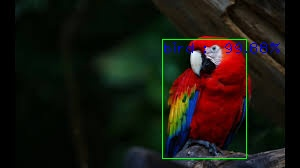

Детекция объектов на изображении произведена


In [51]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSbscrh-ivJ0kK6nCq7LFFYxIm6bZF2z4URWA&usqp=CAU')

print(object_detection(req))

[{'name': 'apple', 'percentage_probability': 98.74, 'box_points': [7, 44, 32, 77]}, {'name': 'apple', 'percentage_probability': 99.78, 'box_points': [24, 69, 47, 90]}, {'name': 'apple', 'percentage_probability': 99.94, 'box_points': [204, 104, 247, 146]}, {'name': 'apple', 'percentage_probability': 97.52, 'box_points': [46, 119, 73, 157]}, {'name': 'apple', 'percentage_probability': 97.87, 'box_points': [107, 66, 141, 100]}]


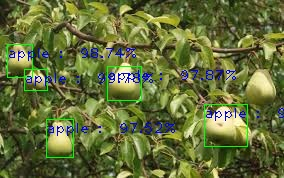

Детекция объектов на изображении произведена


In [50]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQX_ryLbe_IJSuGdafcrwghmGu3dlkKx0ho5Q&usqp=CAU')

print(object_detection(req))

[{'name': 'boat', 'percentage_probability': 99.03, 'box_points': [78, 105, 112, 137]}]


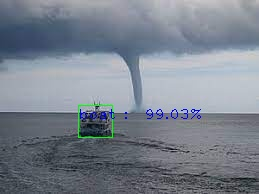

Детекция объектов на изображении произведена


In [55]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAoHCBYVFRUVFRYZGBgYGBgYGBgYFRwYGBgYGBgZGRgYGBgcIS4lHB4rIRgYJjgmKy8xNTU1GiQ7QDs0Py40NTEBDAwMEA8PGBERGDEdGB0xMTExMTExMTExMTQxMTExMTQxNDE0MTExNDExNDExMTExMT8xMTExMTExMTExMTExMf/AABEIAMIBAwMBIgACEQEDEQH/xAAbAAACAwEBAQAAAAAAAAAAAAACAwABBAUGB//EAD0QAAEDAgMEBwUGBgMBAQAAAAEAAhEDIRIxUQRBYXEFEyKBkaGxMpLB0fAUQlJTcuEGFWKCovGTstLCI//EABcBAQEBAQAAAAAAAAAAAAAAAAABAgP/xAAaEQEBAQEBAQEAAAAAAAAAAAAAEQESIQIx/9oADAMBAAIRAxEAPwDMyqie9YG1E0PXeOdbKdVbKVVcprlop1YWdxa6raiJu1DesbNoQvribqRa3O2oaqm7UubUq7skzZ3EAqwrqsrJ4qrlMrGYTTVWYV0OsUxhc4VlH1UhXSDwoXhc8VlG1EhW4vQOKS2oilVVl0ImVEuQludCsZb2PWqm+y5dF071qY9Z3FrY56JrrLPjUL0WmGqmNqTvWCo9XTqKQroGoQq69YKtUyg61IV0+tS3vWA1CrFZIVq61W58hY3PUFRIUuo+6KlUCXVukEwkSun9qVLl9YoryteRD0baixdapjXaONdIVVfW8VzQ8osacldFlc6q31yc1z2vTA9SFbDW1voU1u2Fc8FEHJCuk3ayU1u0Fcxj1oY9ItbuuVissmNTrFI1W8VkxlVc5r01tRIV0BURiosDHo+sUi1sxqi6VkNVQVEiVrY8haaddc4VFbKibi11xUlCaiyU6ia2FmAn1JUa+FmrmEDaqsG91SUsOWfrEbHgKLTS9UXpDiVRciHGoh65ZnvSy9IVuFVA8rJ1qMVkhTFEHWKKjxAKIFLCsFdXM4FSUAVqhjSja5KCNpQPBVyltTA1QW1y0NckNamAJA0FFKTCIKQppJRtekYlWJOStjXo3PWIVFfWKRa0l6sPWcOTWuSFOD0TXpQKIBIVqZUTWV1kaCjCRa11HYhCxFxFimgqnic0hVsq6q21FnLCoAQkK1dchdUSYKsMKQqPqIcSLqSVOoKQoS5CHJn2YqxspSJS8aid9jdorUhXk+oVigV2dk6PxC8ha29FDUrVSPPs2dObsy7Y6IGvkjHRMb1ehwxsqYNjXfpdHAZm60s2MBToebbsiMbP9QvSjYm6ImbGBv8AFSkecp7IStH8qcvQU9lG+O4LQwR/pKvLzNbolzRryUp9EvK9SByULFOtOXmf5O5A7oZ69S2kmNop0Z8vGV+iHtGICfVc9fReoC87/EXROEdawWyeBzs5XPvNXfnccJgWilRLsgl0QvT9BbOHMcT+OO6Am/WYzmVxmbI7RambAYleiGxgZIhsoU6xrnXDp9H6oK2xEZL0P2biodnTrDnXmWbM4nJOdsDhum25d9uzAbgnBnAKdLnzrzY2B2h8E1nRjjmF6AM4Igp0ufLi0Oi4zC0s6LG8LpqFwU60mMLejGjJWejm6BbDUCsPS/RPlgb0W3/SP+XMmb/BbcSrEpu/RPln+yN+iqWjEol0mPH0p0XQY1G2mExrQtVOSsHBGGcE0FEClOS20kYpJgKIFS6vOAFFWKKMOUDlLpMD1SvqUeJXjVukwHVKxSRh6LErdJgBSVhsIp4KsXBQ8FjQvwuBa64IgjUHNVPBXfRIteKr7P1dR7NDbiNxXpP4feMDho+e4gfIrnfxBTiox34mR7phaegXXe3UA+B/db33GM8d0PV4uSXhKvCViY1dMx8vFV1n1KDAVeEpMLousU6zghwq+rVmJdX1h4KY+IU6tQU08PUnip3q+rUwJ4epAVCEWBXhS4TQyEOJNwKsKlwml4lEeFRLhNccIghBRIq0QVAqw5AYVhUCrBQEFaEFQFAYVgIQVYKBkq5SwVcoDlTEglXKA5UlBKuUHI/iNksY7Rxb7wn/AOSs/Qbu2OLSPJbunBNF3BzT5x8VzOhz/wDozv8ARbz8Z39eoCtLBRBYaEFcoAVcoClXKEFSVAYVoJVygIKIZUlASiqVJQXKiqVUoCUQyog4eJEHoMJ0PgoGnQ+C1A0PRY0rCdD4Igw6HwKBoera9LwnQ+BVhp0PgUQYciDksA6HwKvCdD4IpuI8FYclYTofAq4Oh8EDcSqpWAAJ1A94ho8yEitVDGlzzhaMybLLX22m5jwHtPZdB3YgC5sEiCZaLclB0W1Lkbxc95I8eyUYevOdA12spxVrNc8Rdzm2FzAcGgkdrM7yeC69Da2Psx7HnRrg4wN9tyo2YleJKlSUhSukG4mPGoPldcbon228F0Ns2potKw7M8NJK1n4xu+vRMera9Zdmq4hYpwKzG6fiUCTiVypA2VJSsSmJCnYlZckyrxIU4FSUnHxV4kDSVJSsSvEhTJUJSsSrEoGY+AUSpUVmHr5gKI0RiiNFYKNpSgRS+roxS5+JRBGJSgRTPHxKIMOp953zRCUQKAMB1PvO+asNd+J3vu+aOSiBKEB2vxP993zVy/8AE/33/NFdECdUHP2/aXANAdUc7EDhZUeHgCTIIMhc0bVVr1HB5eQA44Hvc4NcXNyDjz5bkqttbWOL2gF3tRLswIkiYm0LHR29xLnBkH73bdfuUHSFeox7IDwWzggkCzSJaG3Blx4mF0OidpquBxvfjZ2CS5zXONnnQmN/MLiUekiSHYHSJyfYWJnLn4rt7DWxG0yBiLnESMQaC1sDLsjNPxf10RXqfmP/AOR/zU+0VPzKn/I/5oSTqfBS+pRAukmSSTqSSUTZ1PifmpiOqJjzqrQdOs8ZPeOT3D4prdpqfmP/AOR3zQNedxTGuOqnotu01PzH++75oxtVT8b/AH3K2g8UUI0obVU/Mf75UG2VPzH++UZ5kKQdT8FKngftdX8b/eKv7ZV/Mf75Vlp4+iHCdfLil1fE+21fzH+8q+3VvzH++rLXbvryQvY7u4JUiHpGt+a/3kJ6Srfmv94fJVgdqgc117+PzVUX8zr/AJj/ABHyVHpSv+a/xHyQFrt59EOA8/regb/NK/5rvL5KknAfqFaDktcjCDEJ/dHOXwVZGCjDkp7iGk4Zg6j1OStr3RMRwNzwuDkgcCiCyPqgQXPIOcNIjkQBcK3bRxflkAB6hBrCi5tWoHCXMBO6XX8glvqgmwA35k379yg6uIZzYZ3HLOVnrbYwB0HEYNhNzpO7msbGOOQB1gDztZEGOyLw3k+PQItcOv0gJu2DJmTeZySjtonITbgY5jNekYGMBwAOc6S5xaMR/uOaOqGvaRUDXC1jBI0IIuFqsR51m0tc7tCdw7OZiLmeJ7l0tn6Qc0gQGtDwcLRm3CAZJuTxlK+xU9zDa/tuInvOi17MwNnCJBvEzlvOqm61mOmzpBhvDu8H5o6ddrvZIJGYkysYf/QL6EIyQBJY7u/YqLGyUbHLE3amREPHNp9RkmM2lsTjYLxcD480I3MKa1xWNlV0T2XcAACRwTG7UQCXMLe8HxEorY0HX0TGjisuz7Ux47J52+OS1A8vFBeFEGcFUfXwU+tUFhvJQBQKiAfr5IIQdVR5+qIlDO/PkT6IKPNAeYTIn6KkTr5oySOYQlnEfXen4NQfBDhGvfZArqzqFE/qufgPkog8sahnD3zEDlJ3onudECx1ibckDXc++B4IsU304koGBkwXXMdw5Dclu2VhMxHdJTQYHyNvSysvvofqJQKFANyHlHkFARcQQdM+9U6sT96DNjEk6zwWes82ueYmTlkdx4ICruIyuDaTAMJuzhsC3r6rEx8mbm95NuC0h+7DyAQai4AQAR5eZFkh1KbjL9U/sqe51gG85MRwsLpWB8+w0cpcfNATKZG7nafFPaTF7jdu8iVkY57T7I42IjlEom1nSIpnK949WoNJZN/KfJG2NO4JLHneyDzB+Kc15/qHc30QE2nP3R7pA8ZTWUgN0HmpiJAiTO8mI7lYYcz3dq3nvQU+iw7gdf8AajNkZph4zBjQFE4xunvlPpAnICOd+6JQY3dEsmGnDxEydZcrZ0Y5hlryRvl8DTLCV1GM3bs848jCaGcPMI05lWu8CDgkEe214/yDYPilN2yDD6TWuiQRtNMA82OeCu1fQ/XFTCDcgSdRfxKDH9oaRdxZb72Agz/U0kQOfetVKs2cIe2SJADmyRvIANwjE6nKInccxAQhrQSQ1oJzIAG7edFA5vPxP14qg4ROWWciNJBuksYLy1o32JN9ZIEq2U2t9nzJcJ4Am37oLLyZAbUA/E3Df9JknyVNED70xMF8u5XREi1+Y1VYRbI8YvnuQCbCSSTyv56WV4CBlbWSDO+wCXU2drnFxF4AGZAGoi4QN2ZgMhrhJv2nD4qh73QMuFyoHDUevxS4IiMR7gPM5oC2QYe8bowZeOfcgdPLxUSeq/rqeX/lUg8/TdFnNFtJEeacbD5ArLUJNw0xqHNI8RZaqJBBEe6QD52KrK2T/o+ZlUxhEHMaHMawd6B4aDk6eQnyz3pzXgb+cQECXiD7GoyyHf8ANLdTBAtvsPZ5G0rXlr8EUicz4FQYAws5ciTOslEysBFje94ByzyTzsoxSDc8CCdMjlxTKVKBAcffdPmUGU7W3MgWn70ZcIuhG0g2Dje+QPeJFwtLqLpPatEXaw+cJdLZRJ7QcTl2GW4SAgT1ozxv0zA9IhEx28Z8Xk7r5IzTAMERP4Qb8Zn1VGkLkCBNiLE9+aAWVX2nBBnIuDv+xkqm1H4iJJA1LiPEOTm0IkmZ43NsrfNTq97d03ANvJAIqvj2W34xvPCUJ2p8xDBH9XzCMkjOSbm8yDutCHHxIGZF7X5oI3aTcEN5gk98FNp7VH3x3kHyCNlQaE65khR5kwATPCe4oLZ0k2YxjO4C0M2oSYJcd0EuJ7ks7OSOw4z+i3eBdIfRcTBLHH9FxyvI5SjTrU3uAAwkcxHOUx1UgXIHMR43XHaxzSJ68CZBa1zm5Z2sm0qjDONznZZ0rgeCDoisSR2mxv7BnudMJjC/UxuAY0ecrD9tpMsXAHTCQT3a8EVPpFh3vbxcwgeIlQbXvIy/6D5qmveZu3hYz6rK7pJgsazZH3S+DyggXSW7WXOszszGNxaPdBuUHSxnePX5qNrTcyByKQdLu5ZeSjKgBjfxufVAx1RpPtf4keaN2HfedSPkk9a07/ASEBLZt8PSbKgg1ou0uBO8PnyMhWHu3PfxIw/EdyVUB3Fw3+1E8MjKHHAnxsD5iEGjrT+J3g35KLL9oOjfruVoOMxrZPZic8N/DRWbZYx/cBbTmqY7FaL552jvVkCAN/p4Zoyex8iDJyMkt+OZTDSBIgCItLHDlcSO9Y8G4XgQD/oWRNaRIJtO6fmg0skTBFp+9bkQiFYSLf4/GQhp1BviIgXFvKO5W5oyEQb6m3JA04u1EHgANd4zUbUMZb87gcuPclGn4nfByS2uc05k3Fh6wUGnGLez4T4IXuP4QY1MR3BQ1PxSOGSEPmc/iUFuP7jLvvcoA2N0R4HvUPCZ4iPWVWeYGf8Aoo0trd1wmMbETBNoiRfWIS2kbvLcmscLzwtb5oyF7Hbj3EWkcryo+2d3actJ3WRugDT+6PQJbnNcd05+0SfOEaLBGjR+p4B7tQi6ubFhO72QOzqDO/vUcyb4Wkg5Ty3x5Jjy3MDCQcjeLe1aOKAG7PJIaxwINrAX3xJBJRYL2cMrZ4sXEQEzt4RBki95A8pvZWys4kY2Q7KA8xfgW23oMzmPzGORIJEtvItnORN0DKzsQmD+o3gmIN/XJdGdxouPHsOA45qVKjAQCYFsywxHAifA71BjG0OMYMHazILX6jIeZ5pVTFHba3jDhE653G+y3ll3YWiZyLCAL54lRovkAUw4cXMEeR8igxbMRMYWubkOzG+9zHgjbRY4w5jZE/dJy3doDyK1MpEgQwAG5xBrhofZeD5JLtlI3NJB/MdnO+ASI4koFtptyYYkAhoc0G95IlC8vBhrmOIzEtxeJJGmiM0ngnstIgS7G6TrIcI+skhuzlvs9Xf28Ra6BMiBNjI1KJBB9YyC14dHtYWwOcSkltefbcLTOAAniBhMeSt9YlxGJgMDeJkZwC1UCSCXEwBdzHt7Im4wi48UUp1euM6z+JDWx3nNH9q2g2D3O/tbHLcY4om0qR7IcTacxGeckRfxRU9mcBIJ3/fnLjI9EZaKTq0Dsn/D/wBKLL2t2L3mn4qI0r90Q9k8yqUVZW7Id/ojoqKKhzsnd/ohdl3j0UUQJ2T2Xc/iE/ceZ9VSii4Q3Px9FGvOpyG9UoitIzHM+qF+SiiJgteQR0MvriooiLp5Dn8kVQWKiiNBcbhODAaYJAJ1Ik56qKIKo5D9AVbX979Q9Qoogy1nkAwSIeYgxGS1veYmTMZzyVKINNG7WzftHO/3ldTXfe/ioooJSpNuYEltzAk21XO6RqubUhpIGI2BIH3dwVqJg3A2H93qrpDsjv8AUKKIE1j2u8qVNN1reKiiDPtbBDhAiBaFpbSbGQyG4aqKIFkKlFFR/9k=')

print(object_detection(req))

[{'name': 'person', 'percentage_probability': 100.0, 'box_points': [1049, 277, 1093, 393]}, {'name': 'car', 'percentage_probability': 83.55, 'box_points': [785, 110, 993, 203]}, {'name': 'car', 'percentage_probability': 96.09, 'box_points': [597, 114, 806, 217]}, {'name': 'car', 'percentage_probability': 99.16, 'box_points': [645, 629, 838, 781]}, {'name': 'car', 'percentage_probability': 91.42, 'box_points': [208, 131, 410, 227]}, {'name': 'car', 'percentage_probability': 77.92, 'box_points': [0, 154, 208, 263]}, {'name': 'car', 'percentage_probability': 96.65, 'box_points': [395, 116, 591, 213]}, {'name': 'car', 'percentage_probability': 94.18, 'box_points': [1088, 622, 1200, 778]}, {'name': 'car', 'percentage_probability': 80.1, 'box_points': [51, 404, 202, 537]}, {'name': 'car', 'percentage_probability': 95.82, 'box_points': [164, 622, 359, 779]}, {'name': 'car', 'percentage_probability': 77.4, 'box_points': [434, 375, 548, 445]}, {'name': 'car', 'percentage_probability': 79.26, 'b

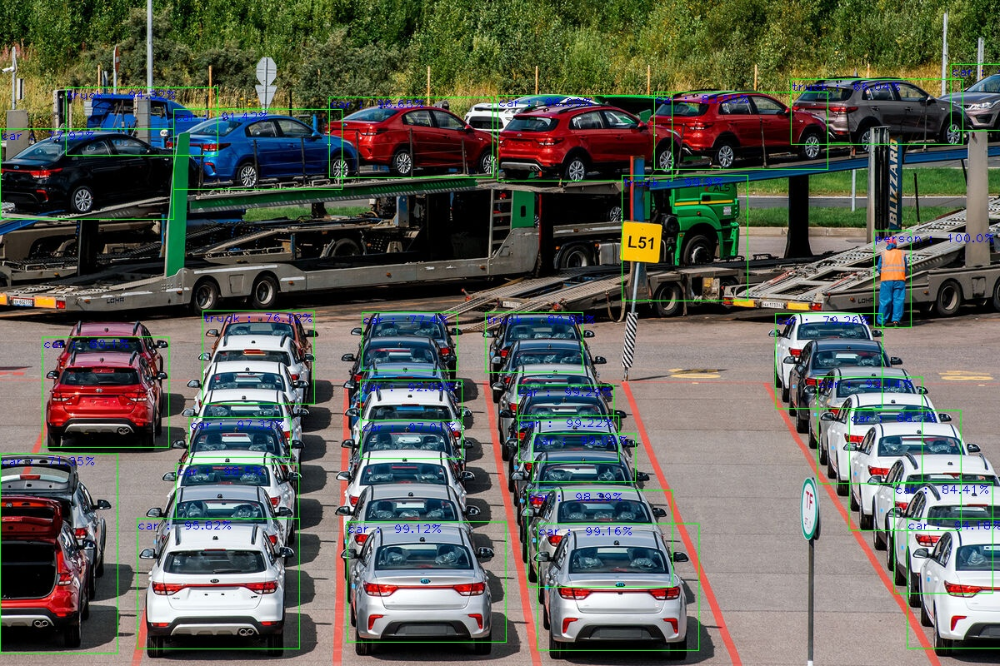

Детекция объектов на изображении произведена


In [40]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('https://img.gazeta.ru/files3/572/17247572/RIA_5975961-pic_32ratio_1200x800-1200x800-58492.jpg')

print(object_detection(req))

[{'name': 'person', 'percentage_probability': 99.99, 'box_points': [93, 50, 131, 156]}, {'name': 'person', 'percentage_probability': 99.97, 'box_points': [145, 57, 192, 154]}, {'name': 'person', 'percentage_probability': 100.0, 'box_points': [23, 51, 70, 157]}, {'name': 'person', 'percentage_probability': 99.94, 'box_points': [192, 51, 271, 168]}, {'name': 'car', 'percentage_probability': 92.78, 'box_points': [49, 47, 91, 79]}, {'name': 'car', 'percentage_probability': 64.85, 'box_points': [179, 43, 205, 65]}, {'name': 'car', 'percentage_probability': 99.1, 'box_points': [134, 38, 142, 45]}, {'name': 'car', 'percentage_probability': 99.54, 'box_points': [165, 44, 178, 53]}]


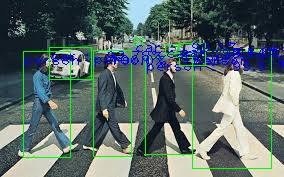

Детекция объектов на изображении произведена


In [42]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQmdP6P-Dm0WqJb_BmMBuBr0EsTl9lMSIjp9A&usqp=CAU')

print(object_detection(req))

# Задание №2. Классификация изображений

2.1. Перейдите по ссылке из примера №2

2.2. Загрузите готовую модель для классификации изображений, отличную от той, что представлена в примере

2.3. Используя данную модель, обработе 5 изображений, которые относятся к разным классам

2.4. Сохраните полученные предсказания используемой модели

In [77]:
from imageai.Classification import ImageClassification
import os

def image_classification(image_link):
    try:
        req = image_link

        image = np.asarray(bytearray(req.read()), dtype=np.uint8) # преобразуем потоковый набор данных в массив numpy
        image = cv2.imdecode(image, -1) # декодируем изображение в привычный для отображения формат

        execution_path = "/content/drive/MyDrive/Предварительно обученные модели/inception.pth"

        prediction = ImageClassification()
        prediction.setModelTypeAsInceptionV3()
        prediction.setModelPath(execution_path)
        prediction.loadModel()

        cv2_imshow(image)

        predictions, probabilities = prediction.classifyImage((image), result_count=10)
        for eachPrediction, eachProbability in zip(predictions, probabilities):
            print(eachPrediction , " : " , eachProbability)

        return "Изображение классифицировано"
    except:
        return "Не удалось классифицировать или считать изображение"

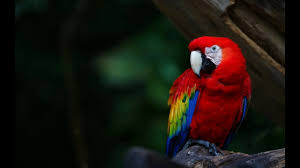

macaw  :  97.7684
indigo bunting  :  0.7149
jacamar  :  0.4795
jay  :  0.27
European gallinule  :  0.1917
lorikeet  :  0.0611
bee eater  :  0.0482
African grey  :  0.0441
toucan  :  0.0317
partridge  :  0.0252
Изображение классифицировано


In [78]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSbscrh-ivJ0kK6nCq7LFFYxIm6bZF2z4URWA&usqp=CAU')

print(image_classification(req))

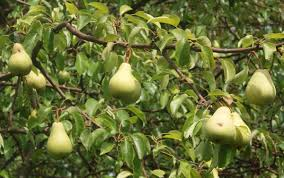

Granny Smith  :  90.1096
pot  :  4.3511
lemon  :  1.2514
earthstar  :  1.2081
pomegranate  :  0.7387
acorn  :  0.4018
greenhouse  :  0.3895
fig  :  0.3596
orange  :  0.1917
custard apple  :  0.1555
Изображение классифицировано


In [79]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQX_ryLbe_IJSuGdafcrwghmGu3dlkKx0ho5Q&usqp=CAU')

print(image_classification(req))

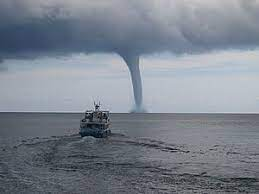

sandbar  :  52.4702
fireboat  :  13.6743
drilling platform  :  5.8066
lakeside  :  5.5983
missile  :  3.24
boathouse  :  3.1477
lifeboat  :  2.386
pier  :  2.3765
seashore  :  0.887
crane  :  0.7177
Изображение классифицировано


In [80]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAoHCBYVFRUVFRYZGBgYGBgYGBgYFRwYGBgYGBgZGRgYGBgcIS4lHB4rIRgYJjgmKy8xNTU1GiQ7QDs0Py40NTEBDAwMEA8PGBERGDEdGB0xMTExMTExMTExMTQxMTExMTQxNDE0MTExNDExNDExMTExMT8xMTExMTExMTExMTExMf/AABEIAMIBAwMBIgACEQEDEQH/xAAbAAACAwEBAQAAAAAAAAAAAAACAwABBAUGB//EAD0QAAEDAgMEBwUGBgMBAQAAAAEAAhEDIRIxUQRBYXEFEyKBkaGxMpLB0fAUQlJTcuEGFWKCovGTstLCI//EABcBAQEBAQAAAAAAAAAAAAAAAAABAgP/xAAaEQEBAQEBAQEAAAAAAAAAAAAAEQESIQIx/9oADAMBAAIRAxEAPwDMyqie9YG1E0PXeOdbKdVbKVVcprlop1YWdxa6raiJu1DesbNoQvribqRa3O2oaqm7UubUq7skzZ3EAqwrqsrJ4qrlMrGYTTVWYV0OsUxhc4VlH1UhXSDwoXhc8VlG1EhW4vQOKS2oilVVl0ImVEuQludCsZb2PWqm+y5dF071qY9Z3FrY56JrrLPjUL0WmGqmNqTvWCo9XTqKQroGoQq69YKtUyg61IV0+tS3vWA1CrFZIVq61W58hY3PUFRIUuo+6KlUCXVukEwkSun9qVLl9YoryteRD0baixdapjXaONdIVVfW8VzQ8osacldFlc6q31yc1z2vTA9SFbDW1voU1u2Fc8FEHJCuk3ayU1u0Fcxj1oY9ItbuuVissmNTrFI1W8VkxlVc5r01tRIV0BURiosDHo+sUi1sxqi6VkNVQVEiVrY8haaddc4VFbKibi11xUlCaiyU6ia2FmAn1JUa+FmrmEDaqsG91SUsOWfrEbHgKLTS9UXpDiVRciHGoh65ZnvSy9IVuFVA8rJ1qMVkhTFEHWKKjxAKIFLCsFdXM4FSUAVqhjSja5KCNpQPBVyltTA1QW1y0NckNamAJA0FFKTCIKQppJRtekYlWJOStjXo3PWIVFfWKRa0l6sPWcOTWuSFOD0TXpQKIBIVqZUTWV1kaCjCRa11HYhCxFxFimgqnic0hVsq6q21FnLCoAQkK1dchdUSYKsMKQqPqIcSLqSVOoKQoS5CHJn2YqxspSJS8aid9jdorUhXk+oVigV2dk6PxC8ha29FDUrVSPPs2dObsy7Y6IGvkjHRMb1ehwxsqYNjXfpdHAZm60s2MBToebbsiMbP9QvSjYm6ImbGBv8AFSkecp7IStH8qcvQU9lG+O4LQwR/pKvLzNbolzRryUp9EvK9SByULFOtOXmf5O5A7oZ69S2kmNop0Z8vGV+iHtGICfVc9fReoC87/EXROEdawWyeBzs5XPvNXfnccJgWilRLsgl0QvT9BbOHMcT+OO6Am/WYzmVxmbI7RambAYleiGxgZIhsoU6xrnXDp9H6oK2xEZL0P2biodnTrDnXmWbM4nJOdsDhum25d9uzAbgnBnAKdLnzrzY2B2h8E1nRjjmF6AM4Igp0ufLi0Oi4zC0s6LG8LpqFwU60mMLejGjJWejm6BbDUCsPS/RPlgb0W3/SP+XMmb/BbcSrEpu/RPln+yN+iqWjEol0mPH0p0XQY1G2mExrQtVOSsHBGGcE0FEClOS20kYpJgKIFS6vOAFFWKKMOUDlLpMD1SvqUeJXjVukwHVKxSRh6LErdJgBSVhsIp4KsXBQ8FjQvwuBa64IgjUHNVPBXfRIteKr7P1dR7NDbiNxXpP4feMDho+e4gfIrnfxBTiox34mR7phaegXXe3UA+B/db33GM8d0PV4uSXhKvCViY1dMx8vFV1n1KDAVeEpMLousU6zghwq+rVmJdX1h4KY+IU6tQU08PUnip3q+rUwJ4epAVCEWBXhS4TQyEOJNwKsKlwml4lEeFRLhNccIghBRIq0QVAqw5AYVhUCrBQEFaEFQFAYVgIQVYKBkq5SwVcoDlTEglXKA5UlBKuUHI/iNksY7Rxb7wn/AOSs/Qbu2OLSPJbunBNF3BzT5x8VzOhz/wDozv8ARbz8Z39eoCtLBRBYaEFcoAVcoClXKEFSVAYVoJVygIKIZUlASiqVJQXKiqVUoCUQyog4eJEHoMJ0PgoGnQ+C1A0PRY0rCdD4Igw6HwKBoera9LwnQ+BVhp0PgUQYciDksA6HwKvCdD4IpuI8FYclYTofAq4Oh8EDcSqpWAAJ1A94ho8yEitVDGlzzhaMybLLX22m5jwHtPZdB3YgC5sEiCZaLclB0W1Lkbxc95I8eyUYevOdA12spxVrNc8Rdzm2FzAcGgkdrM7yeC69Da2Psx7HnRrg4wN9tyo2YleJKlSUhSukG4mPGoPldcbon228F0Ns2potKw7M8NJK1n4xu+vRMera9Zdmq4hYpwKzG6fiUCTiVypA2VJSsSmJCnYlZckyrxIU4FSUnHxV4kDSVJSsSvEhTJUJSsSrEoGY+AUSpUVmHr5gKI0RiiNFYKNpSgRS+roxS5+JRBGJSgRTPHxKIMOp953zRCUQKAMB1PvO+asNd+J3vu+aOSiBKEB2vxP993zVy/8AE/33/NFdECdUHP2/aXANAdUc7EDhZUeHgCTIIMhc0bVVr1HB5eQA44Hvc4NcXNyDjz5bkqttbWOL2gF3tRLswIkiYm0LHR29xLnBkH73bdfuUHSFeox7IDwWzggkCzSJaG3Blx4mF0OidpquBxvfjZ2CS5zXONnnQmN/MLiUekiSHYHSJyfYWJnLn4rt7DWxG0yBiLnESMQaC1sDLsjNPxf10RXqfmP/AOR/zU+0VPzKn/I/5oSTqfBS+pRAukmSSTqSSUTZ1PifmpiOqJjzqrQdOs8ZPeOT3D4prdpqfmP/AOR3zQNedxTGuOqnotu01PzH++75oxtVT8b/AH3K2g8UUI0obVU/Mf75UG2VPzH++UZ5kKQdT8FKngftdX8b/eKv7ZV/Mf75Vlp4+iHCdfLil1fE+21fzH+8q+3VvzH++rLXbvryQvY7u4JUiHpGt+a/3kJ6Srfmv94fJVgdqgc117+PzVUX8zr/AJj/ABHyVHpSv+a/xHyQFrt59EOA8/regb/NK/5rvL5KknAfqFaDktcjCDEJ/dHOXwVZGCjDkp7iGk4Zg6j1OStr3RMRwNzwuDkgcCiCyPqgQXPIOcNIjkQBcK3bRxflkAB6hBrCi5tWoHCXMBO6XX8glvqgmwA35k379yg6uIZzYZ3HLOVnrbYwB0HEYNhNzpO7msbGOOQB1gDztZEGOyLw3k+PQItcOv0gJu2DJmTeZySjtonITbgY5jNekYGMBwAOc6S5xaMR/uOaOqGvaRUDXC1jBI0IIuFqsR51m0tc7tCdw7OZiLmeJ7l0tn6Qc0gQGtDwcLRm3CAZJuTxlK+xU9zDa/tuInvOi17MwNnCJBvEzlvOqm61mOmzpBhvDu8H5o6ddrvZIJGYkysYf/QL6EIyQBJY7u/YqLGyUbHLE3amREPHNp9RkmM2lsTjYLxcD480I3MKa1xWNlV0T2XcAACRwTG7UQCXMLe8HxEorY0HX0TGjisuz7Ux47J52+OS1A8vFBeFEGcFUfXwU+tUFhvJQBQKiAfr5IIQdVR5+qIlDO/PkT6IKPNAeYTIn6KkTr5oySOYQlnEfXen4NQfBDhGvfZArqzqFE/qufgPkog8sahnD3zEDlJ3onudECx1ibckDXc++B4IsU304koGBkwXXMdw5Dclu2VhMxHdJTQYHyNvSysvvofqJQKFANyHlHkFARcQQdM+9U6sT96DNjEk6zwWes82ueYmTlkdx4ICruIyuDaTAMJuzhsC3r6rEx8mbm95NuC0h+7DyAQai4AQAR5eZFkh1KbjL9U/sqe51gG85MRwsLpWB8+w0cpcfNATKZG7nafFPaTF7jdu8iVkY57T7I42IjlEom1nSIpnK949WoNJZN/KfJG2NO4JLHneyDzB+Kc15/qHc30QE2nP3R7pA8ZTWUgN0HmpiJAiTO8mI7lYYcz3dq3nvQU+iw7gdf8AajNkZph4zBjQFE4xunvlPpAnICOd+6JQY3dEsmGnDxEydZcrZ0Y5hlryRvl8DTLCV1GM3bs848jCaGcPMI05lWu8CDgkEe214/yDYPilN2yDD6TWuiQRtNMA82OeCu1fQ/XFTCDcgSdRfxKDH9oaRdxZb72Agz/U0kQOfetVKs2cIe2SJADmyRvIANwjE6nKInccxAQhrQSQ1oJzIAG7edFA5vPxP14qg4ROWWciNJBuksYLy1o32JN9ZIEq2U2t9nzJcJ4Am37oLLyZAbUA/E3Df9JknyVNED70xMF8u5XREi1+Y1VYRbI8YvnuQCbCSSTyv56WV4CBlbWSDO+wCXU2drnFxF4AGZAGoi4QN2ZgMhrhJv2nD4qh73QMuFyoHDUevxS4IiMR7gPM5oC2QYe8bowZeOfcgdPLxUSeq/rqeX/lUg8/TdFnNFtJEeacbD5ArLUJNw0xqHNI8RZaqJBBEe6QD52KrK2T/o+ZlUxhEHMaHMawd6B4aDk6eQnyz3pzXgb+cQECXiD7GoyyHf8ANLdTBAtvsPZ5G0rXlr8EUicz4FQYAws5ciTOslEysBFje94ByzyTzsoxSDc8CCdMjlxTKVKBAcffdPmUGU7W3MgWn70ZcIuhG0g2Dje+QPeJFwtLqLpPatEXaw+cJdLZRJ7QcTl2GW4SAgT1ozxv0zA9IhEx28Z8Xk7r5IzTAMERP4Qb8Zn1VGkLkCBNiLE9+aAWVX2nBBnIuDv+xkqm1H4iJJA1LiPEOTm0IkmZ43NsrfNTq97d03ANvJAIqvj2W34xvPCUJ2p8xDBH9XzCMkjOSbm8yDutCHHxIGZF7X5oI3aTcEN5gk98FNp7VH3x3kHyCNlQaE65khR5kwATPCe4oLZ0k2YxjO4C0M2oSYJcd0EuJ7ks7OSOw4z+i3eBdIfRcTBLHH9FxyvI5SjTrU3uAAwkcxHOUx1UgXIHMR43XHaxzSJ68CZBa1zm5Z2sm0qjDONznZZ0rgeCDoisSR2mxv7BnudMJjC/UxuAY0ecrD9tpMsXAHTCQT3a8EVPpFh3vbxcwgeIlQbXvIy/6D5qmveZu3hYz6rK7pJgsazZH3S+DyggXSW7WXOszszGNxaPdBuUHSxnePX5qNrTcyByKQdLu5ZeSjKgBjfxufVAx1RpPtf4keaN2HfedSPkk9a07/ASEBLZt8PSbKgg1ou0uBO8PnyMhWHu3PfxIw/EdyVUB3Fw3+1E8MjKHHAnxsD5iEGjrT+J3g35KLL9oOjfruVoOMxrZPZic8N/DRWbZYx/cBbTmqY7FaL552jvVkCAN/p4Zoyex8iDJyMkt+OZTDSBIgCItLHDlcSO9Y8G4XgQD/oWRNaRIJtO6fmg0skTBFp+9bkQiFYSLf4/GQhp1BviIgXFvKO5W5oyEQb6m3JA04u1EHgANd4zUbUMZb87gcuPclGn4nfByS2uc05k3Fh6wUGnGLez4T4IXuP4QY1MR3BQ1PxSOGSEPmc/iUFuP7jLvvcoA2N0R4HvUPCZ4iPWVWeYGf8Aoo0trd1wmMbETBNoiRfWIS2kbvLcmscLzwtb5oyF7Hbj3EWkcryo+2d3actJ3WRugDT+6PQJbnNcd05+0SfOEaLBGjR+p4B7tQi6ubFhO72QOzqDO/vUcyb4Wkg5Ty3x5Jjy3MDCQcjeLe1aOKAG7PJIaxwINrAX3xJBJRYL2cMrZ4sXEQEzt4RBki95A8pvZWys4kY2Q7KA8xfgW23oMzmPzGORIJEtvItnORN0DKzsQmD+o3gmIN/XJdGdxouPHsOA45qVKjAQCYFsywxHAifA71BjG0OMYMHazILX6jIeZ5pVTFHba3jDhE653G+y3ll3YWiZyLCAL54lRovkAUw4cXMEeR8igxbMRMYWubkOzG+9zHgjbRY4w5jZE/dJy3doDyK1MpEgQwAG5xBrhofZeD5JLtlI3NJB/MdnO+ASI4koFtptyYYkAhoc0G95IlC8vBhrmOIzEtxeJJGmiM0ngnstIgS7G6TrIcI+skhuzlvs9Xf28Ra6BMiBNjI1KJBB9YyC14dHtYWwOcSkltefbcLTOAAniBhMeSt9YlxGJgMDeJkZwC1UCSCXEwBdzHt7Im4wi48UUp1euM6z+JDWx3nNH9q2g2D3O/tbHLcY4om0qR7IcTacxGeckRfxRU9mcBIJ3/fnLjI9EZaKTq0Dsn/D/wBKLL2t2L3mn4qI0r90Q9k8yqUVZW7Id/ojoqKKhzsnd/ohdl3j0UUQJ2T2Xc/iE/ceZ9VSii4Q3Px9FGvOpyG9UoitIzHM+qF+SiiJgteQR0MvriooiLp5Dn8kVQWKiiNBcbhODAaYJAJ1Ik56qKIKo5D9AVbX979Q9Qoogy1nkAwSIeYgxGS1veYmTMZzyVKINNG7WzftHO/3ldTXfe/ioooJSpNuYEltzAk21XO6RqubUhpIGI2BIH3dwVqJg3A2H93qrpDsjv8AUKKIE1j2u8qVNN1reKiiDPtbBDhAiBaFpbSbGQyG4aqKIFkKlFFR/9k=')

print(image_classification(req))

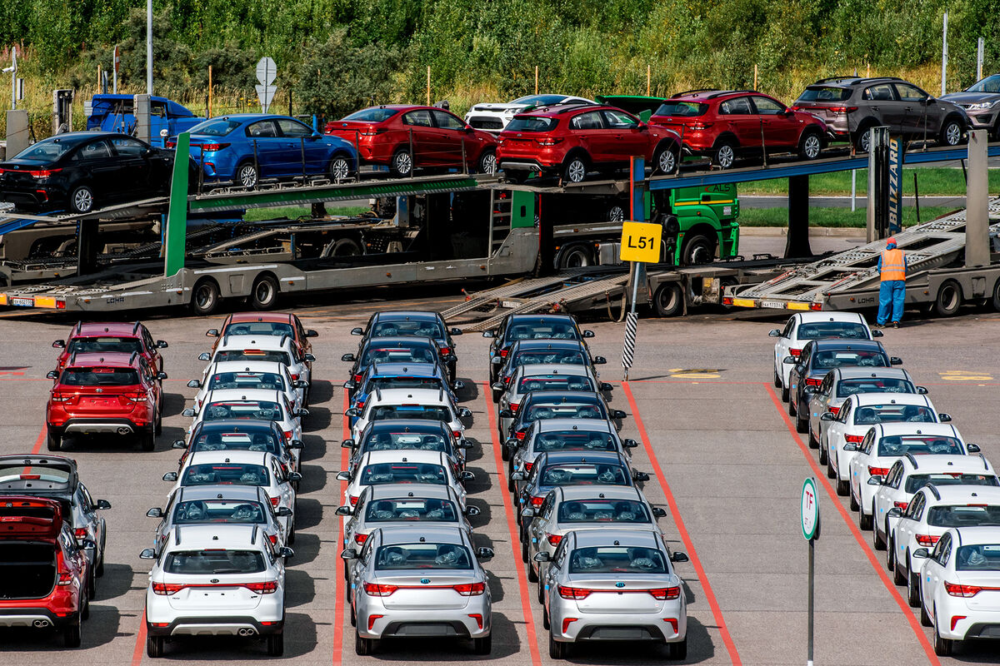

shopping cart  :  84.3428
ashcan  :  3.1431
barrow  :  2.3298
folding chair  :  2.3003
stretcher  :  1.2892
safety pin  :  0.539
cab  :  0.5142
grocery store  :  0.3857
umbrella  :  0.3338
padlock  :  0.316
Изображение классифицировано


In [81]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('https://img.gazeta.ru/files3/572/17247572/RIA_5975961-pic_32ratio_1200x800-1200x800-58492.jpg')

print(image_classification(req))

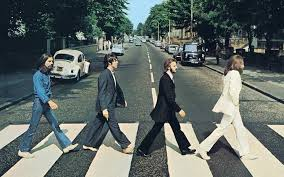

lakeside  :  61.1866
gondola  :  6.8497
obelisk  :  6.4253
abaya  :  3.9813
killer whale  :  2.5582
sunglass  :  1.8296
pier  :  1.7604
triumphal arch  :  1.2866
sundial  :  0.8786
dock  :  0.7704
Изображение классифицировано


In [82]:
# используя метод urlopen, получаем объект запроса по ссылке (изображение) и сохраняем его в виде потокового набора данных в переменную
req = urlopen('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQmdP6P-Dm0WqJb_BmMBuBr0EsTl9lMSIjp9A&usqp=CAU')

print(image_classification(req))

# Задание №3. Детекция и трекинг объектов на видеопотоке

## 3.1. Подготовка набора данных:

* Найдите и загрузите из сети Интернет 5 видеофайлов с большим количеством разнородных объектов в кадре (например запись с камеры видеонаблюдения на шоссе и тд) длительностью от 30 секунд до 1 минуты (Также Вы можете скачать видеофайл большей длительности, а затем обрезать его в одном из [онлйан-сервисов](https://online-video-cutter.com/ru/?ysclid=lfjb8zk8er484677266).


* Для более оптимальной работы с видеофайлами, сожмите их, используя онлайн-сервисы. ([Например тут](https://compress-video-online.com/ru/ ))

## 3.2. Детекция и трекинг объектов на видеопотоке

3.2.1. [Ознакомьтесь с технической документацией](https://imageai.readthedocs.io/en/latest/video/index.html)

3.2.2. Загрузите готовую модель для детекции объектов

3.2.3. Используя данную модель, обработайте 5 видеофайлов (см. п. 3.1.)

3.2.4. Сохраните полученные видеофайлы

In [ ]:
# Ваш код